# How can RFM analysis be used to identify customer churn patterns?

In [604]:
import pandas as pd
import datetime as dt
import numpy as np

In [605]:
df = pd.read_csv('/Users/danielyeo/Desktop/Global_Superstore.csv', encoding='ISO-8859-1')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
0,32298,CA-2012-124891,31-07-2012,31-07-2012,Same Day,RH-19495,Rick Hansen,Consumer,New York City,New York,...,TEC-AC-10003033,Technology,Accessories,Plantronics CS510 - Over-the-Head monaural Wir...,2309.650,7,0.0,762.1845,933.57,Critical
1,26341,IN-2013-77878,05-02-2013,07-02-2013,Second Class,JR-16210,Justin Ritter,Corporate,Wollongong,New South Wales,...,FUR-CH-10003950,Furniture,Chairs,"Novimex Executive Leather Armchair, Black",3709.395,9,0.1,-288.7650,923.63,Critical
2,25330,IN-2013-71249,17-10-2013,18-10-2013,First Class,CR-12730,Craig Reiter,Consumer,Brisbane,Queensland,...,TEC-PH-10004664,Technology,Phones,"Nokia Smart Phone, with Caller ID",5175.171,9,0.1,919.9710,915.49,Medium
3,13524,ES-2013-1579342,28-01-2013,30-01-2013,First Class,KM-16375,Katherine Murray,Home Office,Berlin,Berlin,...,TEC-PH-10004583,Technology,Phones,"Motorola Smart Phone, Cordless",2892.510,5,0.1,-96.5400,910.16,Medium
4,47221,SG-2013-4320,05-11-2013,06-11-2013,Same Day,RH-9495,Rick Hansen,Consumer,Dakar,Dakar,...,TEC-SHA-10000501,Technology,Copiers,"Sharp Wireless Fax, High-Speed",2832.960,8,0.0,311.5200,903.04,Critical


In [606]:
df.shape

(51290, 24)

In [607]:
#check for null values
df.isnull().sum()

Row ID                0
Order ID              0
Order Date            0
Ship Date             0
Ship Mode             0
Customer ID           0
Customer Name         0
Segment               0
City                  0
State                 0
Country               0
Postal Code       41296
Market                0
Region                0
Product ID            0
Category              0
Sub-Category          0
Product Name          0
Sales                 0
Quantity              0
Discount              0
Profit                0
Shipping Cost         0
Order Priority        0
dtype: int64

In [608]:
#let's drop Postal Code, missing date, don't need
df = df.drop(columns = ['Postal Code'], inplace = False)

In [609]:
# cust_freq = df.groupby('Customer Name').size().reset_index(name = 'Order Count')
# cust_freq

# RFM Analysis 

## R Recency: How recently a customer made a purchase

## F Frequency: How often a customer makes a purchase

## M Monetary Value: How much money a customer spends


#### identify high-value customers, at-risk customers, and churn-prone customers

In [610]:
df['Order Date'].value_counts()

Order Date
18-06-2014    135
18-11-2014    127
03-09-2014    126
20-11-2014    118
29-12-2014    116
             ... 
07-10-2012      1
16-01-2011      1
27-02-2011      1
21-10-2012      1
06-02-2011      1
Name: count, Length: 1430, dtype: int64

#### Our date format is dd-mm-yyyy, so let's tell Pandas to parse dates as day-month-year.

In [611]:
df['Order Date'] = pd.to_datetime(df['Order Date'], format='%d-%m-%Y', errors='coerce')
df['Order Date'].value_counts()

Order Date
2014-06-18    135
2014-11-18    127
2014-09-03    126
2014-11-20    118
2014-12-29    116
             ... 
2012-10-07      1
2011-01-16      1
2011-02-27      1
2012-10-21      1
2011-02-06      1
Name: count, Length: 1430, dtype: int64

Recency

In [612]:
#lower recency score means customer purchased more recently
recency = df.groupby(by='Customer Name', as_index=False)['Order Date'].max()

recency.columns = ['Customer Name', 'Last Purchase']

recent_date = recency['Last Purchase'].max()

recency['Recency'] = recency['Last Purchase'].apply(lambda x: (recent_date - x).days)

recency.head()

,Customer Name,Last Purchase,Recency
0,Aaron Bergman,2014-12-15,16
1,Aaron Hawkins,2014-12-19,12
2,Aaron Smayling,2014-12-08,23
3,Adam Bellavance,2014-11-26,35
4,Adam Hart,2014-12-29,2


Frequency

In [613]:
#higher frequency score means customer buys more often
frequency = df.drop_duplicates().groupby(by=['Customer Name'], as_index=False)['Order Date'].count()

frequency.columns = ['Customer Name', 'Frequency']

frequency.head()

,Customer Name,Frequency
0,Aaron Bergman,89
1,Aaron Hawkins,56
2,Aaron Smayling,60
3,Adam Bellavance,68
4,Adam Hart,84


Monetary

In [614]:
#higher monetary value means more money
monetary = df.groupby(by='Customer Name', as_index=False)['Sales'].sum()

monetary.columns = ['Customer Name', 'Monetary']

monetary.head()

,Customer Name,Monetary
0,Aaron Bergman,24644.62750
1,Aaron Hawkins,20759.51384
2,Aaron Smayling,14212.62840
3,Adam Bellavance,20186.77840
4,Adam Hart,21718.20142


Merge

In [615]:
rf = recency.merge(frequency, on = 'Customer Name')

rfm = rf.merge(monetary, on = 'Customer Name').drop(columns='Last Purchase')

rfm.head()

,Customer Name,Recency,Frequency,Monetary
0,Aaron Bergman,16,89,24644.62750
1,Aaron Hawkins,12,56,20759.51384
2,Aaron Smayling,23,60,14212.62840
3,Adam Bellavance,35,68,20186.77840
4,Adam Hart,2,84,21718.20142


In [616]:
# Apply quantiles for segmentation
rfm['R_Score'] = pd.qcut(rfm['Recency'], 4, labels=[4, 3, 2, 1]) #4 being most recent purchase, 1 being longest times since last purchase
rfm['F_Score'] = pd.qcut(rfm['Frequency'], 4, labels=[1, 2, 3, 4])
rfm['M_Score'] = pd.qcut(rfm['Monetary'], 4, labels=[1, 2, 3, 4])

In [617]:
rfm.head()

,Customer Name,Recency,Frequency,Monetary,R_Score,F_Score,M_Score
0,Aaron Bergman,16,89,24644.62750,3,4,4
1,Aaron Hawkins,12,56,20759.51384,3,2,4
2,Aaron Smayling,23,60,14212.62840,2,2,2
3,Adam Bellavance,35,68,20186.77840,1,3,4
4,Adam Hart,2,84,21718.20142,4,4,4


In [618]:
rfm.describe()

,Recency,Frequency,Monetary
count,795.000000,795.000000,795.000000
mean,23.368553,64.515723,15902.518126
std,27.438069,13.432477,5209.813042
min,0.000000,29.000000,3892.227000
25%,6.000000,55.000000,12242.608650
50%,16.000000,64.000000,15257.533900
75%,33.000000,74.000000,18770.796450
max,428.000000,108.000000,40488.070800


In [619]:
rfm['RFM_Score'] = rfm['R_Score'].astype(int) + rfm['F_Score'].astype(int) + rfm['M_Score'].astype(int)

rfm['Churn Status'] = rfm['RFM_Score'].apply(lambda x: 'Non-Churn' if x >= 8 else 'Churn')

In [620]:
rfm.head()

,Customer Name,Recency,Frequency,Monetary,R_Score,F_Score,M_Score,RFM_Score,Churn Status
0,Aaron Bergman,16,89,24644.62750,3,4,4,11,Non-Churn
1,Aaron Hawkins,12,56,20759.51384,3,2,4,9,Non-Churn
2,Aaron Smayling,23,60,14212.62840,2,2,2,6,Churn
3,Adam Bellavance,35,68,20186.77840,1,3,4,8,Non-Churn
4,Adam Hart,2,84,21718.20142,4,4,4,12,Non-Churn


In [621]:
rfm['Churn Status'].value_counts(normalize=True)

Churn Status
Churn        0.506918
Non-Churn    0.493082
Name: proportion, dtype: float64

In [622]:
rfm.shape

(795, 9)

In [623]:
#merge the primary df to our rfm df by Customer Name and Churn Status into cust_analysis df
cust_analysis = df.merge(rfm[['Customer Name', 'RFM_Score', 'Churn Status']], on = 'Customer Name', how = 'left')



cust_analysis.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority,RFM_Score,Churn Status
0,32298,CA-2012-124891,2012-07-31,31-07-2012,Same Day,RH-19495,Rick Hansen,Consumer,New York City,New York,...,Accessories,Plantronics CS510 - Over-the-Head monaural Wir...,2309.650,7,0.0,762.1845,933.57,Critical,7,Churn
1,26341,IN-2013-77878,2013-02-05,07-02-2013,Second Class,JR-16210,Justin Ritter,Corporate,Wollongong,New South Wales,...,Chairs,"Novimex Executive Leather Armchair, Black",3709.395,9,0.1,-288.7650,923.63,Critical,6,Churn
2,25330,IN-2013-71249,2013-10-17,18-10-2013,First Class,CR-12730,Craig Reiter,Consumer,Brisbane,Queensland,...,Phones,"Nokia Smart Phone, with Caller ID",5175.171,9,0.1,919.9710,915.49,Medium,12,Non-Churn
3,13524,ES-2013-1579342,2013-01-28,30-01-2013,First Class,KM-16375,Katherine Murray,Home Office,Berlin,Berlin,...,Phones,"Motorola Smart Phone, Cordless",2892.510,5,0.1,-96.5400,910.16,Medium,11,Non-Churn
4,47221,SG-2013-4320,2013-11-05,06-11-2013,Same Day,RH-9495,Rick Hansen,Consumer,Dakar,Dakar,...,Copiers,"Sharp Wireless Fax, High-Speed",2832.960,8,0.0,311.5200,903.04,Critical,7,Churn


In [624]:
cust_analysis.shape

(51290, 25)

## Calculate Shipping time

In [625]:
cust_analysis['Order Date'].value_counts()
cust_analysis['Ship Date'].value_counts()

Ship Date
22-11-2014    130
07-09-2014    115
07-12-2014    101
17-11-2014    101
29-11-2014    100
             ... 
25-01-2011      3
07-01-2015      3
03-01-2011      2
06-01-2011      2
05-01-2011      2
Name: count, Length: 1464, dtype: int64

#### Our date format is dd-mm-yyyy, so let's tell Pandas to parse dates as day-month-year.

In [626]:
cust_analysis['Order Date'] = pd.to_datetime(cust_analysis['Order Date'], format='%d-%m-%Y', errors='coerce')
cust_analysis['Ship Date'] = pd.to_datetime(cust_analysis['Ship Date'], format='%d-%m-%Y', errors='coerce')

In [627]:
#Shipping Time converted to days as integers
cust_analysis['Shipping Time'] = (cust_analysis['Ship Date'] - cust_analysis['Order Date']).dt.days

In [628]:
cust_analysis.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority,RFM_Score,Churn Status,Shipping Time
0,32298,CA-2012-124891,2012-07-31,2012-07-31,Same Day,RH-19495,Rick Hansen,Consumer,New York City,New York,...,Plantronics CS510 - Over-the-Head monaural Wir...,2309.650,7,0.0,762.1845,933.57,Critical,7,Churn,0
1,26341,IN-2013-77878,2013-02-05,2013-02-07,Second Class,JR-16210,Justin Ritter,Corporate,Wollongong,New South Wales,...,"Novimex Executive Leather Armchair, Black",3709.395,9,0.1,-288.7650,923.63,Critical,6,Churn,2
2,25330,IN-2013-71249,2013-10-17,2013-10-18,First Class,CR-12730,Craig Reiter,Consumer,Brisbane,Queensland,...,"Nokia Smart Phone, with Caller ID",5175.171,9,0.1,919.9710,915.49,Medium,12,Non-Churn,1
3,13524,ES-2013-1579342,2013-01-28,2013-01-30,First Class,KM-16375,Katherine Murray,Home Office,Berlin,Berlin,...,"Motorola Smart Phone, Cordless",2892.510,5,0.1,-96.5400,910.16,Medium,11,Non-Churn,2
4,47221,SG-2013-4320,2013-11-05,2013-11-06,Same Day,RH-9495,Rick Hansen,Consumer,Dakar,Dakar,...,"Sharp Wireless Fax, High-Speed",2832.960,8,0.0,311.5200,903.04,Critical,7,Churn,1


# EDA Visualization

In [629]:
import plotly.express as px

## RFM Analysis

In [630]:
rfm.head()

,Customer Name,Recency,Frequency,Monetary,R_Score,F_Score,M_Score,RFM_Score,Churn Status
0,Aaron Bergman,16,89,24644.62750,3,4,4,11,Non-Churn
1,Aaron Hawkins,12,56,20759.51384,3,2,4,9,Non-Churn
2,Aaron Smayling,23,60,14212.62840,2,2,2,6,Churn
3,Adam Bellavance,35,68,20186.77840,1,3,4,8,Non-Churn
4,Adam Hart,2,84,21718.20142,4,4,4,12,Non-Churn


###### Let's visualize how balanced our dataset is

In [631]:
fig = px.histogram(rfm, x="Churn Status", title="Non-Churn Count vs. Churn Count")
fig.show()

In [632]:
fig = px.histogram(rfm, x="RFM_Score", color="Churn Status", title = "Visualization of Churn Status by RFM Score")
fig.show()

In [633]:
fig = px.line(rfm, x="Frequency", y="Monetary", color="Churn Status", title="RFM: Frequency by Monetary")
fig.show()

#### To no surpise, non-churn customers purchase and spend more than churn customers

### Shipping

In [635]:
fig = px.histogram(cust_analysis, x="Category", y="Shipping Time", color="Churn Status", title="Customer Category by Shipping Time")
fig.show()

fig = px.histogram(cust_analysis, x="Shipping Time", y="Shipping Cost", color="Churn Status", title = "Customer Shipping Time by Shipping Cost")
fig.show()

fig = px.histogram(cust_analysis, x="Order Priority", color="Churn Status", title="Churn Status by Order Priority")
fig.show()

fig = px.histogram(cust_analysis, x="Ship Mode", y="Shipping Cost", color="Churn Status", title = "Customer Shipping Mode by Shipping Cost")
fig.show()

Total shipping costs are higher for non-churn customers, but because they make more purchases and spend more than churn customers, nothing here can give us a clear reason for churn.

##### None of these visualizations show any explanation in terms of how shipping could correlate with churn.

### Feature Engineerging

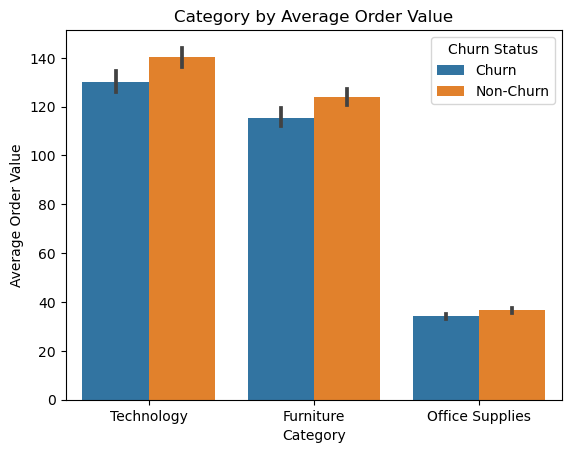

In [636]:
#lets create average order value using Sales/quantity
cust_analysis['Average Order Value'] = cust_analysis['Sales'] / cust_analysis['Quantity']

import seaborn as sns
import matplotlib.pyplot as plt
#average order value
sns.barplot(data=cust_analysis, x="Category", y="Average Order Value", hue="Churn Status")
plt.title("Category by Average Order Value")

#customer total count by category
fig = px.histogram(cust_analysis, x="Category", color="Churn Status", title="Customer Total Count by Category")
fig.show()

Despite non-churn customers placing more orders, the average order value looks nearly identical between churn and non-churn which soldifies our findings:
##### churn customers are placing fewer orders than non-churn customers; churn behavior may not be linked to spending behavior.

## RFM Risk Tiers Focus over Churn Status Metrics

In [637]:
rfm['Risk Tiers'] = rfm['RFM_Score'].apply(lambda x: 'High Risk' if x <= 6 else ('Moderate Risk' if x <= 8 else 'Low Risk'))
rfm.head()

,Customer Name,Recency,Frequency,Monetary,R_Score,F_Score,M_Score,RFM_Score,Churn Status,Risk Tiers
0,Aaron Bergman,16,89,24644.62750,3,4,4,11,Non-Churn,Low Risk
1,Aaron Hawkins,12,56,20759.51384,3,2,4,9,Non-Churn,Low Risk
2,Aaron Smayling,23,60,14212.62840,2,2,2,6,Churn,High Risk
3,Adam Bellavance,35,68,20186.77840,1,3,4,8,Non-Churn,Moderate Risk
4,Adam Hart,2,84,21718.20142,4,4,4,12,Non-Churn,Low Risk


In [638]:
rfm['Risk Tiers'].value_counts(normalize=True)

Risk Tiers
Low Risk         0.363522
High Risk        0.345912
Moderate Risk    0.290566
Name: proportion, dtype: float64

In [639]:
cust_analysis = cust_analysis.merge(rfm[['Customer Name', 'Risk Tiers']], on='Customer Name', how='left')
cust_analysis.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Quantity,Discount,Profit,Shipping Cost,Order Priority,RFM_Score,Churn Status,Shipping Time,Average Order Value,Risk Tiers
0,32298,CA-2012-124891,2012-07-31,2012-07-31,Same Day,RH-19495,Rick Hansen,Consumer,New York City,New York,...,7,0.0,762.1845,933.57,Critical,7,Churn,0,329.950,Moderate Risk
1,26341,IN-2013-77878,2013-02-05,2013-02-07,Second Class,JR-16210,Justin Ritter,Corporate,Wollongong,New South Wales,...,9,0.1,-288.7650,923.63,Critical,6,Churn,2,412.155,High Risk
2,25330,IN-2013-71249,2013-10-17,2013-10-18,First Class,CR-12730,Craig Reiter,Consumer,Brisbane,Queensland,...,9,0.1,919.9710,915.49,Medium,12,Non-Churn,1,575.019,Low Risk
3,13524,ES-2013-1579342,2013-01-28,2013-01-30,First Class,KM-16375,Katherine Murray,Home Office,Berlin,Berlin,...,5,0.1,-96.5400,910.16,Medium,11,Non-Churn,2,578.502,Low Risk
4,47221,SG-2013-4320,2013-11-05,2013-11-06,Same Day,RH-9495,Rick Hansen,Consumer,Dakar,Dakar,...,8,0.0,311.5200,903.04,Critical,7,Churn,1,354.120,Moderate Risk


In [648]:
fig = px.histogram(cust_analysis, x="Order Date", y="Sales", color="Risk Tiers", title="Sales Over Time by Risk Tier")
fig.show()

Analyze high risk customers

In [641]:
high_risk = cust_analysis[cust_analysis['Risk Tiers']== 'High Risk']

print(high_risk['Sales'].mean())
print(high_risk['Shipping Cost'].mean())
print(high_risk['Shipping Time'].mean())

220.9579654908991
24.036218974076117
4.002413127413128


Analye moderate risk customers

In [642]:
mod_risk = cust_analysis[cust_analysis['Risk Tiers']== 'Moderate Risk']

print(mod_risk['Sales'].mean())
print(mod_risk['Shipping Cost'].mean())
print(mod_risk['Shipping Time'].mean())

241.5444889887944
25.81428783583097
3.922100715539355


Analyze low risk customers

In [643]:
low_risk = cust_analysis[cust_analysis['Risk Tiers']== 'Low Risk']

print(low_risk['Sales'].mean())
print(low_risk['Shipping Cost'].mean())
print(low_risk['Shipping Time'].mean())

266.67975234480247
28.299040141998912
3.979428363371564


The average shipping time between high risk and low risk customers are essentially the same and shipping costs don't have a big difference, meaning shipping variables don't seem to correlate with churn.

With spending behavior and shipping variables not telling us much about churn, let's dive into discounts.

## Discount by Risk Tiers

In [669]:
#proportion of risk tiers
risk_tier_counts = rfm['Risk Tiers'].value_counts(normalize=True).reset_index()
risk_tier_counts.columns = ['Risk Tiers', 'Proportion']

fig = px.histogram(risk_tier_counts, x="Risk Tiers", y="Proportion", color="Risk Tiers", title="Proportion of Customers by Risk Tiers")
fig.show()

#discount by risk tiers
fig = px.histogram(cust_analysis, x="Discount", y="Risk Tiers", title="Discount by Risk Tier Customers")
fig.show()

#discount by risk tiers
fig = px.histogram(cust_analysis, x="Discount", color="Risk Tiers", title="Discount by Risk Tier Customers")
fig.show()

Low risk customers receive a higher count of discounts compared to high and moderate risk customers, but discounts from 0.004 - 0.005 heavily dominate the graph. Discounts also seem to not be highly correlated with churn prevention.

# Key Takeaways:
#### Churn customers place fewer orders: Churn behavior seems more influenced by engagement freqeuncy rather than spending behavior. 
#### Shipping cost and time show no correlation with churn: reducing churn through shipping incentives are unlikely to yield strong results.
#### Discount strategies are ineffective at reducing churn: Current discount patterns are not well-targeted toward customers.

# Final Key Takeaway:
#### Churn behavior is not significantly influenced by spending behavior, shipping time, shipping costs, or discounts. Instead, churn appears more closely tied to customer engagement frequency and other behavior factors not captured in the dataset. 

